In [31]:
import os
from pathlib import Path
from collections import defaultdict
from PIL import Image
from math import ceil
import matplotlib.pyplot as plt
import random
from tqdm import tqdm

In [32]:
DATA_PATH = Path.cwd().parent / "data"

In [3]:
def count_images_and_sizes(data_path):
    """
    Counts the number of images and calculates image sizes for each leaf and leaf_health_status combination.

    Parameters:
    data_folder (str): The data folder containing subfolders in the format <leaf>__<health_status>.

    Returns:
    dict: A dictionary where keys are tuples (leaf, health_status) and values are dictionaries containing image counts and image sizes.
    """
    image_info = defaultdict(lambda: {'count': 0, 'sizes': []})

    for leaf_health_folder in tqdm(data_path.iterdir()):
        if leaf_health_folder.is_dir() and "___" in leaf_health_folder.name:
            leaf, health_status = leaf_health_folder.name.split('___')
            for image_path in leaf_health_folder.glob('*.[jJp][pPn][gGg]'):
                image = Image.open(image_path)
                image_info[(leaf, health_status)]['count'] += 1
                image_info[(leaf, health_status)]['sizes'].append(image.size)

    return image_info

In [29]:
def plot_distribution(image_info):
    """
    Plots the distribution of image numbers per leaf and per leaf_health_status combination.

    Parameters:
    image_info (dict): Dictionary containing image counts and sizes for each leaf and leaf_health_status combination.
    """
    leaf_counts = defaultdict(int)
    leaf_health_counts = defaultdict(int)

    for (leaf, health_status), info in image_info.items():
        leaf_counts[leaf] += info['count']
        leaf_health_counts[(leaf, health_status)] += info['count']

    # Plot distribution per leaf
    plt.figure(figsize=(12, 10))
    plt.barh(list(leaf_counts.keys()), list(leaf_counts.values()))
    plt.ylabel('Leaf')
    plt.xlabel('Number of Images')
    plt.title('Image Distribution per Leaf')
    plt.show()

    # Plot distribution per leaf and health status
    plt.figure(figsize=(12, 10))
    labels = [f'{leaf}__{health_status}' for (leaf, health_status) in leaf_health_counts.keys()]
    labels.sort()
    counts = list(leaf_health_counts.values())
    plt.barh(labels, counts)
    plt.ylabel('Leaf and Health Status')
    plt.xlabel('Number of Images')
    plt.title('Image Distribution per Leaf and Health Status')
    plt.show()

In [5]:
image_info = count_images_and_sizes(DATA_PATH)

39it [00:09,  4.12it/s]


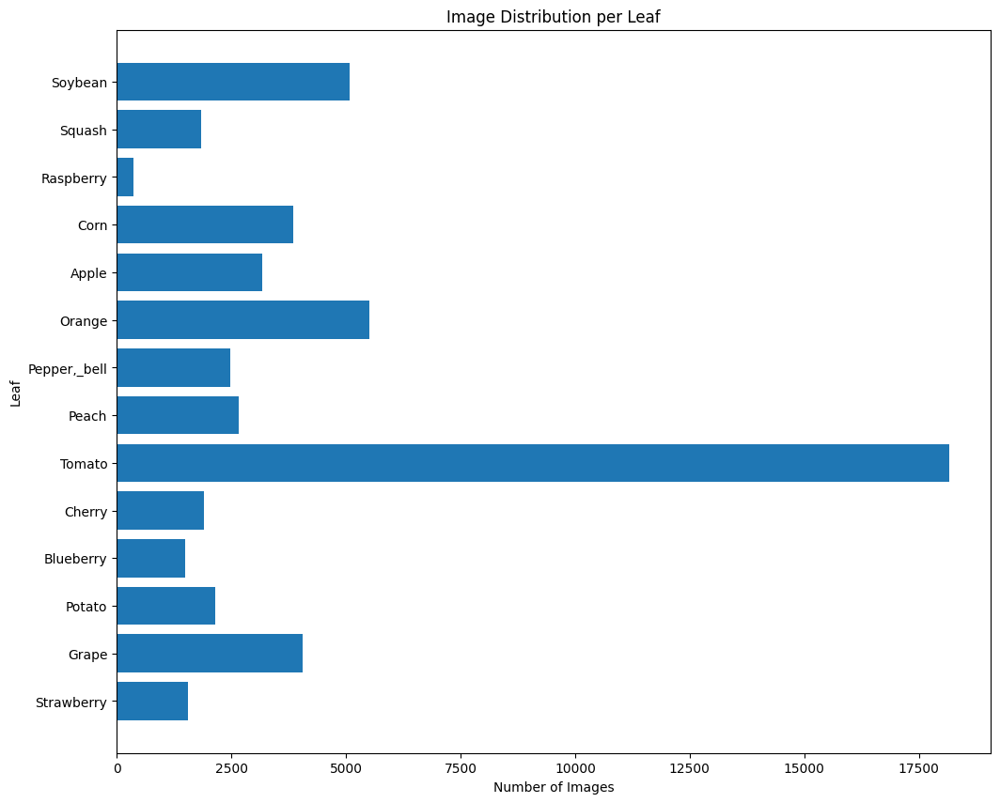

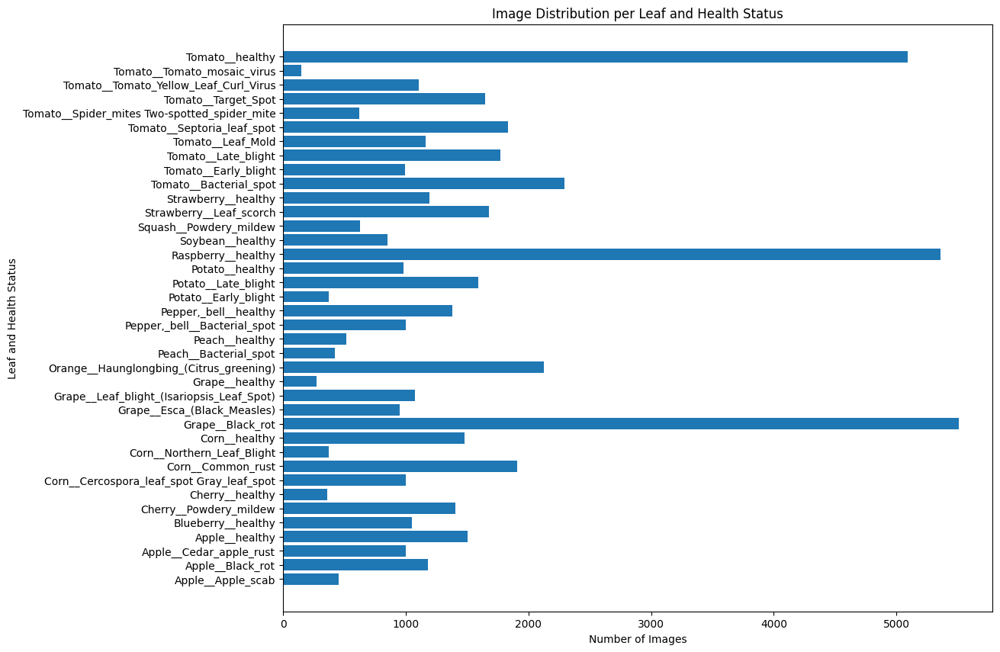

In [30]:
plot_distribution(image_info)

In [7]:
# check image sizes
sizes = []
for _, info in image_info.items():
    sizes.extend(info["sizes"])

print(f"We encounter {len(set(sizes))} different image sizes.")

We encounter 1 different image sizes.


Let's take a look at some images. We also note that there are 38 different leaf and disease status combination, with one addition of Background_without_leaves.

In [8]:
def plot_first_images(data_folder):
    """
    Plots the first image from each subfolder (representing each leaf type) and titles the images with the subfolder name.

    Parameters:
    data_folder (str): The data folder containing subfolders in the format <leaf>__<health_status>.
    """
    data_path = Path(data_folder)

    # Get a list of subfolders (representing each leaf type)
    subfolders = [subfolder for subfolder in data_path.iterdir() if subfolder.is_dir()]

    # Calculate the number of rows and columns for the subplots grid
    num_subplots = len(subfolders)
    num_columns = 3  # Number of images per row
    num_rows = ceil(num_subplots / num_columns)

    # Create a grid of subplots
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))
    axes = axes.flatten()

    for idx, subfolder in enumerate(subfolders):
        # Get the first image in the subfolder
        image_paths = list(subfolder.glob('*.[jJ][pP][gG]'))
        if image_paths:
            image_path = random.choice(image_paths)
            image = Image.open(image_path)
            ax = axes[idx]
            ax.imshow(image)
            ax.set_title(subfolder.name)
            ax.axis('off')

    # Hide any remaining empty subplots
    for i in range(num_subplots, num_rows * num_columns):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

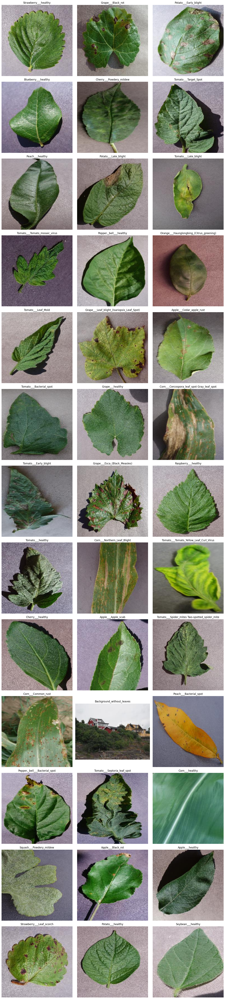

In [9]:
plot_first_images(DATA_DIR)

Upon first look it seams that the leaves where photographed on gray surface. Only in one of the leaves was the backgroud removed. Contrary to this, the Background_without_leaves example shows a random photograph which is completely out of distribution upon first look. 

After having plotted a few of random examples this idea is strengthened. The class Corn___common_rust seams to have the background removed, while the rest of the leave pictures are sharing similar light, background and quality conditions.